---
title: "Módulo: Aprendizaje Automático Aplicado en la Simulación espacio temporal de Suelo Urbano de la Ciudad de Morelia"
format:
  html:
    toc: true
    toc-expand: 2
    toc-location: left
    code-fold: True
    html-math-method: katex
---

# Introducción

Un modelo de simulación de cobertura de suelo es un modelo computacional spacio-temporal basado en estadística y matemáticas, trata de predecir como algun tipo de cobertura se distribuye en esl espacio geográfico en el tiempo.

Estos modelos son muy útiles y son utilizados en la planificación urbana, la gestión de recursos naturales, la conservación del medio ambiente, la agricultura, entre otros. El esquema general de un modelo de simulación de cobertura urbana se muestra en #fig-modelo @fig-modelo

![Modelo Simulacion](figuras/modelo_conceptual_land_change_sim.png){#fig-modelo}


Este esquema esta compuesto de varias partes:

1. El módulo que recibe los mapas transformados en variables dependientes e independientes.
2. El modelo espacial de idoneidad que indica la suceptibilidad de las caracteristicas del terreno para experimentar urbanización.
3. Un modelo temporal de pronóstico de incremento en la cantidad de cobertura urbana.
4. Un método de localizacion que simula cantidad de cobertura pronosticada.
4. Una simulación de la urbanización considerando el modelo espacial y temporal
En este módulo aprenderemos a generar y comparar dos modelos de aprendizaje automático: La regresión Lineal y Regresión con una Red Neuronal de propagación hacia adelante. Estos dos modelos operan en el espacio geográfico para estimar la idoneidad.

Aunque es muy complicado predecir las tendencias espaciales de urbanización, es posible usar estos modelos como referencia.

Este módulo abarca los siguientes temas:

* Aprenderemos teoría básica sobre la regresión lineal
* Funcionamiento básico de las redes neuronales.
* Describiremos el problema de regresión a resolver.
* Cargaremos y visualizaremos los datos
* Construiremos el conjunto de entrenamiento y prueba
* Construiremos dos modelos de regresión Lineal
* Compararemos los modelos en términos de la matriz de confusión, Correlación de Mathews, Area Bajo la curva
* Compararemos los dos mapas de idoneidad

**Pre-requisitos:**

Módulo de Procesamiento de mapas GrassGis.
Módulo de aprendizaje profundo sección redes neuronales profundas de propagación hacia adelante



# Regresión Logística

La regresión logística es un algoritmo de aprendizaje automático que resuelve un problema de clasificación binaria prediciendo la probabilidad de que un vector de características sea clasificado en una clase.

Para esto, la regresión logística se entrena con un conjunto de datos de la forma $\mathbf{D} = \{\mathbf{x}_i, y_i  \}_{i=0}^{m-1}$. Donde $\mathbf{x}_i$ es un vector de características y $y_i \in \{0,1\}$ es una variable binaria que representa la clasificación del vector de características. La regresión logística se define como la siguente Ecuación:


$$\hat{y}_i = f_{reglog}(\mathbf{x}_i| \theta)$$

, y $\mathbf{x} = \{x_0, x_1, \dots, x_{m-1} \}$ es el vector de características y $\hat{y} \in [0, 1]$ es un escalar que indica la probabilidad.

Dónde $\theta = \{w_0, w_1, \dots, w_{n-1}, b\}$ es el vector de parámetros optimizables.

$$f_{reglog}(\mathbf{x}_i|\theta) = \sigma(\mathbf{w}^T \mathbf{x}_i + b) $$

y $\sigma$ está definido por $\sigma(z) = \frac{1}{1+e^{-z}}$

El modelo puede representarse por medio de un grafo direccionado @fig-reglog

![Modelo regresion logistica](figuras/reglog.svg){#fig-reglog}



Para entrenar el modelo, se requiere una función de costo que nos indique que tan cerca está el modelo $f_{reglog}$ del ajuste deseado. Esta función de costo puede ser la log Verosimilitud $LL(\theta)$

$$LL(\theta) = \sum_{i=0}^{m-1} (y_i \text{ log } \sigma(\mathbf{w}^T \mathbf{x}_i+b) + (1-y_i) \text{ log } [1-\sigma(\mathbf{w}^T \mathbf{x}_i+b)])$$

La cual se obtiene de la función de probabilidad de Bernoulli como función de verosimilitud.

$$L(\theta) = \prod_{i=0}^{m-1}\sigma(\mathbf{w}^T \mathbf{x}_i + b )^{y_i} [1-\sigma(\mathbf{w}^T \mathbf{x}_i + b)]^{(1-y_i)} $$


Esta expresión $LL(\theta)$ la usaremos para construir nuestra función objetivo a maximizar. 

$$\mathbf{w},b = \underset{\theta = \{\mathbf{w},b\}}{\text{arg max }} LL(\theta)$$


Esta nos indica que quremos encontrar aquellos parámetros $\theta$ que nos produzcan el mayor valor posible de esta función.





# Red Neuronal Multi Capa

Una red neuronal Artificial es un modelo matemático inspirado en el comportamiento biológico de las neuronas y en la estructura del cerebro. 
Las ideas y descubrimientos en neurociencias sirven como inspiración en la construcción de modelos computacionales capaces de resolver problemas complejos de clasificación y regresión.

Los perceptrones estan formados por:


* La Entrada. Es el vector $\mathbf{x}_i$ de características.
* Los Pesos. Indican la importancia de cada elemento del vector $\mathbf{x}_i$ de entrada. Los pesos forman parte de los parámetros optimizables.
* Función de activación. Es una función no lineal $\phi(\cdot)$. Hay varias funciones de activación, una de ellas es la función sigmoidal utilizada por la regresión logística.


$$f_{perceptron}(\mathbf{x}_i|\theta) = \phi(\mathbf{w}^T \mathbf{x}_i + b) $$


Estos perceptrones simples estan interconectados entre si dando lugar a diferentes tipos de arquitecturas en redes neuronales.


Una Red Neuronal Multi-Capa con propagación hacia adelante tiene la característica de tener sus neuronas organizadas por capas y cada capa se limita a transferir la información hacia adelante desde la capa de entrada hasta la capa de salida. Tal como se muestra en la figura @fig-redneuronal.



![Modelo MLP](figuras/redneuronal.svg){#fig-redneuronal}


# Aplicación: Modelo espacio temporal de cambio de uso de suelo.

Leemos la base de datos.

Tenemos dos conjuntos de datos, uno de entrenameinto y otro de validación.

Ambos conjuntos tienen la misma estructura.


El primer conjunto de datos contiene las características de suelo en el intervalo 2000 al 2018.


La base de datos incluye información sobre las coordenadas cartesianas (lat, lon )en epsg:4232 (Liga a un módulo introductorio a GIS), 








In [463]:
import os
import sys  
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import importlib
import seaborn as sns
import itertools as it
from shapely.geometry import Point, Polygon

root = os.getcwd() + "/.."
sys.path.insert(0, root)
crs_m = 'epsg:4326'

In [464]:
def graficarVariablesEspaciales(data):
    
    geometry = [Point(xy) for xy in zip(data["lat"], data["lon"])]
    geodata = gpd.GeoDataFrame(data, crs = crs_m, geometry = geometry)
    columns = data.columns

    fig, axs = plt.subplots(3, 3, figsize = (10, 10))
    for ix, c in enumerate(it.product(np.arange(3), repeat = 2)):

        i = c[0]
        j = c[1]

        column_name = columns[3+ix]
        geodata.plot(ax = axs[i, j], figsize = (20/4, 15/4), column = geodata[column_name], cmap = "viridis_r", legend = True, markersize = 0.01)
        
        
    plt.tight_layout()
    plt.show()
    
    
def plotParesdeScatterPlots(data):
    
    sns.set_theme(style = "ticks")
    data = data.sample(frac=0.001)
    sns.pairplot(data[data.columns[3:]], hue = "incremento_urbano")
        
    



In [465]:
#Independent Spatial Variables
X_train = pd.read_csv("../data/locations/morelia/processed/Morelia_train_X.csv", header = 0)
Y_train = pd.read_csv("../data/locations/morelia/processed/Morelia_train_Y.csv", header = 0)


Esta tabla tiene las caracteristicas de cada coordenada que representa una región de $30m \times 30m$. 

* ixs es el índice que contiene valores unicos conformados por las coordenadas de latitud y longitus.
* lat es la latitud
* lon es la longitud
* pendiente, es la pendiente topográfica en esa coordenada
* dist_anps. Es la distancia mas cercana en linea recta de la coordenada (lat,lon) a la cobertura de areas naturales protegidas en el año 2000
* dist_agua. Es la distancia mas cercana en linea recta de la coordenada (lat,lon) a la cobertura de cuerpos de agua en el año 2000
* dist_centro. Es la distancia mas cercana en linea recta de la coordenada (lat,lon) al centro Histórico de la ciudad de Morelia
* dist_carreteras: es la distancia mas corta a la carretarea mas cercana desde la coordenada (lat,lon). en el año 2018
* costo: es el costo mínimo de traslado en mínutos desde la coordenada (lat, lon) al centro de la ciudad considerando trayectos en carretera.


De esta información, cada vector $\mathbf{x}_i$ tendrá la información:

* $x_0$: pendiente
* $x_1$: distancia a áreas naturales protegidas
* $x_2$: distancia a cuerpos de agua
* $x_3$: distancia a vegetacion
* $x_4$: distancia acobertura urbana
* $x_5$: Distancia al centro de la ciudad.

In [466]:
X_train.head()

,ixs,lat,lon,pendiente,dist_anps,dist_agua,dist_vegetacion,dist_urbano,dist_centro,dist_carreteras,costo
0,"(261048.43444431, 2197800.28581634)",261048.434444,2.197800e+06,6.379370,19680.839119,212.111013,1248.803589,3447.554694,19913.443890,3636.319906,99.051445
1,"(260868.45322116, 2197770.28111502)",260868.453221,2.197770e+06,4.520227,19775.810448,29.996871,1073.256704,3330.856765,19969.945500,3530.974224,97.796815
2,"(260898.45009169, 2197770.28111502)",260898.450092,2.197770e+06,0.000000,19756.121616,59.993741,1100.167146,3345.547238,19955.995077,3543.566054,97.945904
3,"(260928.44696221, 2197770.28111502)",260928.446962,2.197770e+06,6.379370,19736.458733,89.990612,1127.233414,3360.441263,19942.080016,3556.366322,98.094994
4,"(260958.44383274, 2197770.28111502)",260958.443833,2.197770e+06,5.710593,19716.821879,119.987482,1154.444548,3375.536145,19928.200391,3569.372785,98.244083


In [467]:
Y_train.head()

,ixs,lat,lon,incremento_urbano
0,"(261048.43444431, 2197800.28581634)",261048.434444,2.197800e+06,0
1,"(260868.45322116, 2197770.28111502)",260868.453221,2.197770e+06,0
2,"(260898.45009169, 2197770.28111502)",260898.450092,2.197770e+06,0
3,"(260928.44696221, 2197770.28111502)",260928.446962,2.197770e+06,0
4,"(260958.44383274, 2197770.28111502)",260958.443833,2.197770e+06,0


In [468]:
X_train["incremento_urbano"] = Y_train["incremento_urbano"]

La información del incremento urbano esta dada por la Tabla, la cual contiene al igual que la tabla anterior las coordenadas lat,lon en la columna ixs, lat, lon e incremento urbano que es la observación del incremento urbano en el intervalo de tiempo del año 2000 al 2018

In [469]:
X_valid = pd.read_csv("../data/locations/morelia/processed/Morelia_validation_X.csv", header = 0)
Y_valid = pd.read_csv("../data/locations/morelia/processed/Morelia_validation_Y.csv", header = 0)

## Estructura de los datos

La estructura es la misma para los datos de validación que estan conforomados por las características observadas en el año 2018 y relacionadas con el incremento de cobertura de suelo urbano en 2021

In [470]:
X_valid.head()

,ixs,lat,lon,pendiente,dist_anps,dist_agua,dist_vegetacion,dist_urbano,dist_centro,dist_carreteras,costo
0,"(261048.43444431, 2197800.28581634)",261048.434444,2.197800e+06,6.379370,19680.839119,212.111013,1248.803589,3447.554694,19913.443890,997.266806,44.300857
1,"(260868.45322116, 2197770.28111502)",260868.453221,2.197770e+06,4.520227,19775.810448,29.996871,1073.256704,3330.856765,19969.945500,1106.352244,45.742605
2,"(260898.45009169, 2197770.28111502)",260898.450092,2.197770e+06,0.000000,19756.121616,59.993741,1100.167146,3345.547238,19955.995077,1083.755330,45.405656
3,"(260928.44696221, 2197770.28111502)",260928.446962,2.197770e+06,6.379370,19736.458733,89.990612,1127.233414,3360.441263,19942.080016,1061.525113,45.146802
4,"(260958.44383274, 2197770.28111502)",260958.443833,2.197770e+06,5.710593,19716.821879,119.987482,1154.444548,3375.536145,19928.200391,1039.685116,44.786802


In [471]:
Y_valid.head()

,ixs,lat,lon,incremento_urbano
0,"(261048.43444431, 2197800.28581634)",261048.434444,2.197800e+06,0
1,"(260868.45322116, 2197770.28111502)",260868.453221,2.197770e+06,0
2,"(260898.45009169, 2197770.28111502)",260898.450092,2.197770e+06,0
3,"(260928.44696221, 2197770.28111502)",260928.446962,2.197770e+06,0
4,"(260958.44383274, 2197770.28111502)",260958.443833,2.197770e+06,0


In [472]:
X_valid["incremento_urbano"] = Y_valid["incremento_urbano"]
X_valid.head()

,ixs,lat,lon,pendiente,dist_anps,dist_agua,dist_vegetacion,dist_urbano,dist_centro,dist_carreteras,costo,incremento_urbano
0,"(261048.43444431, 2197800.28581634)",261048.434444,2.197800e+06,6.379370,19680.839119,212.111013,1248.803589,3447.554694,19913.443890,997.266806,44.300857,0
1,"(260868.45322116, 2197770.28111502)",260868.453221,2.197770e+06,4.520227,19775.810448,29.996871,1073.256704,3330.856765,19969.945500,1106.352244,45.742605,0
2,"(260898.45009169, 2197770.28111502)",260898.450092,2.197770e+06,0.000000,19756.121616,59.993741,1100.167146,3345.547238,19955.995077,1083.755330,45.405656,0
3,"(260928.44696221, 2197770.28111502)",260928.446962,2.197770e+06,6.379370,19736.458733,89.990612,1127.233414,3360.441263,19942.080016,1061.525113,45.146802,0
4,"(260958.44383274, 2197770.28111502)",260958.443833,2.197770e+06,5.710593,19716.821879,119.987482,1154.444548,3375.536145,19928.200391,1039.685116,44.786802,0


Enseguida analizamos como se ven estas variables en el espacio del conjunto de entrenamiento.




In [473]:
#graficarVariablesEspaciales(X_train)

Similarmente, Visualizamos el conjunto de validación

In [474]:
X_valid["incremento_urbano"] = Y_valid["incremento_urbano"]
X_valid.head()

,ixs,lat,lon,pendiente,dist_anps,dist_agua,dist_vegetacion,dist_urbano,dist_centro,dist_carreteras,costo,incremento_urbano
0,"(261048.43444431, 2197800.28581634)",261048.434444,2.197800e+06,6.379370,19680.839119,212.111013,1248.803589,3447.554694,19913.443890,997.266806,44.300857,0
1,"(260868.45322116, 2197770.28111502)",260868.453221,2.197770e+06,4.520227,19775.810448,29.996871,1073.256704,3330.856765,19969.945500,1106.352244,45.742605,0
2,"(260898.45009169, 2197770.28111502)",260898.450092,2.197770e+06,0.000000,19756.121616,59.993741,1100.167146,3345.547238,19955.995077,1083.755330,45.405656,0
3,"(260928.44696221, 2197770.28111502)",260928.446962,2.197770e+06,6.379370,19736.458733,89.990612,1127.233414,3360.441263,19942.080016,1061.525113,45.146802,0
4,"(260958.44383274, 2197770.28111502)",260958.443833,2.197770e+06,5.710593,19716.821879,119.987482,1154.444548,3375.536145,19928.200391,1039.685116,44.786802,0


## Conociendo los Datos: Visualización de los datos.


Para explorar los datos inicialmente utilizaremos un mapa de disperción mostrando una muestra de 500 vectores que muestra una idea de a distribución de los datos.

Como ejemplo, se muestra una gráfica en donde se analiza la relacion de la distancia a carretares con el costo de traslado al centro de la ciudad en el año 20018 con la observación el incremento urbano del 2000 al 2018

<Axes: xlabel='dist_carreteras', ylabel='costo'>

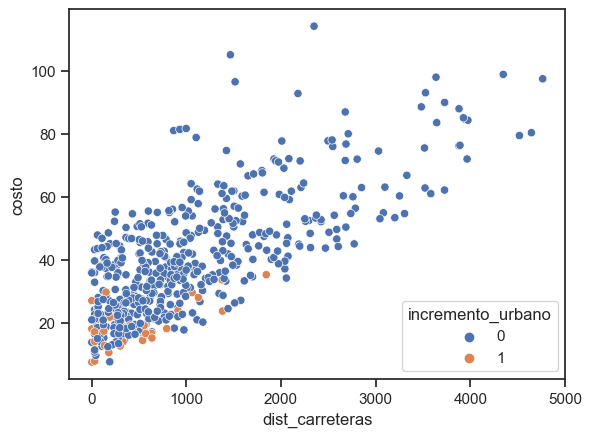

In [476]:
ix = np.random.randint(0, len(X_train), 500)
sns.scatterplot(data = X_train.iloc[ix], x = "dist_carreteras", y = "costo", hue = "incremento_urbano")

El resto de variables se ven en el siguiente análisis de pares de variables del conjunto de entrenamiento en gráficas de dispersión. 

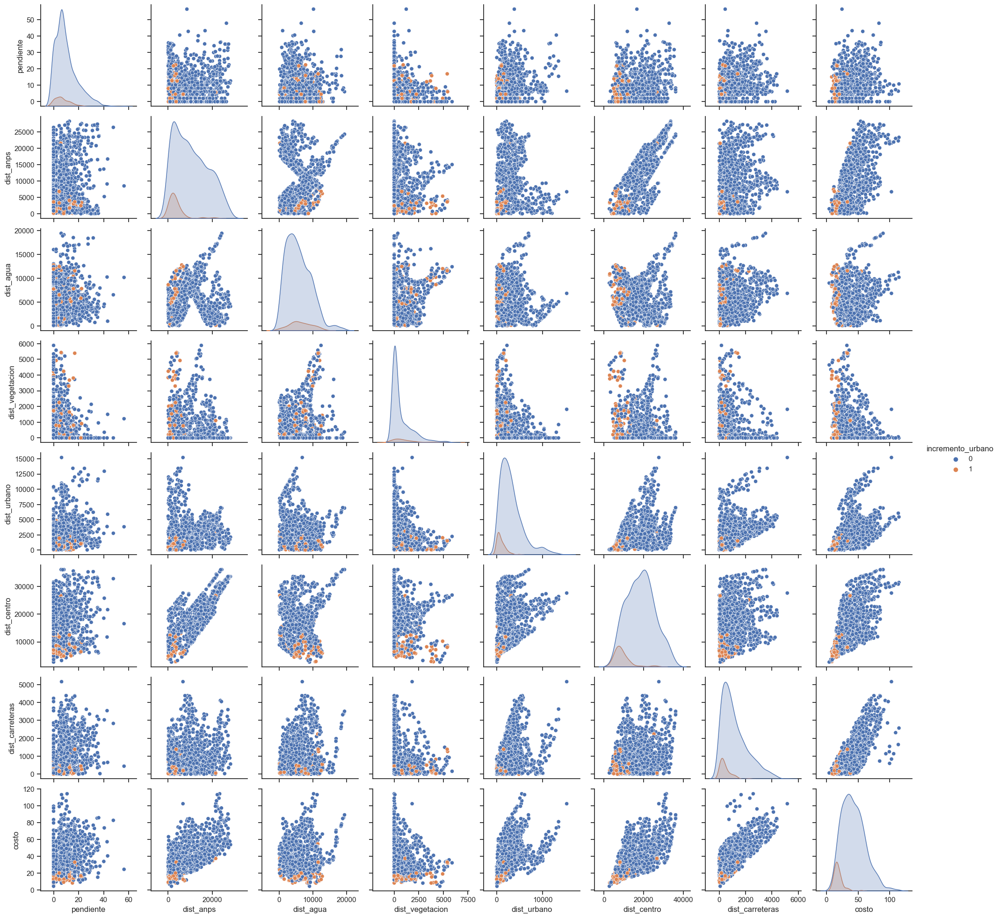

In [15]:
plotParesdeScatterPlots(X_train)

El resto de variables se ven en el siguiente análisis de pares de variables del conjunto de validación en gráficas de dispersión. 

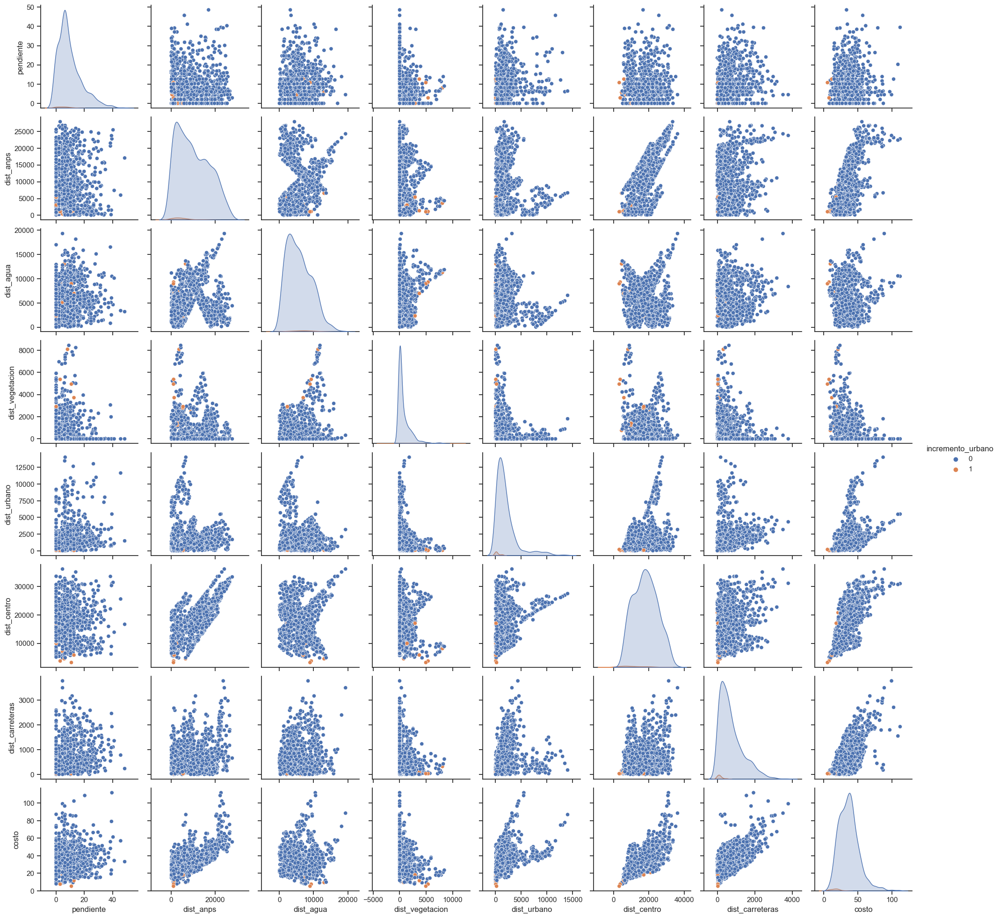

In [16]:
plotParesdeScatterPlots(X_valid)


Podemos apreciar que las celdas con urbanizacion asociada son muy pocas en comparación con con las celdas no urbanizadas.

El número de celdas que experimentan cambio son muy pocos en relación a la totalidad de los datos, por lo que podemos intuir que los datos están muy desbalanceados.

Para esto graficamos unos diagramas de pastel para ver la proporción de celdas que experimentan cambio.

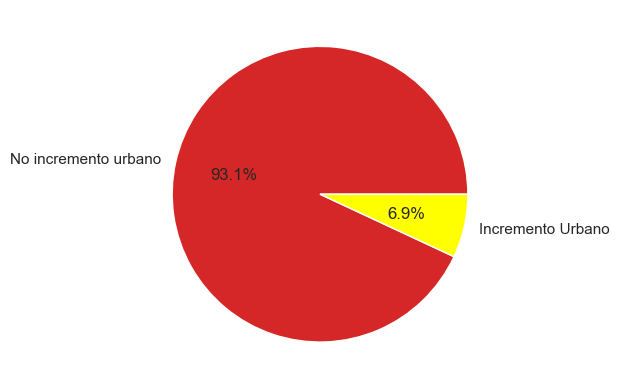

In [478]:
fig, ax = plt.subplots()
labels = ['No incremento urbano', 'Incremento Urbano']
sizes = [len(Y_train["incremento_urbano"]), np.sum(Y_train["incremento_urbano"])]
ax.pie(sizes, labels=labels, autopct='%1.1f%%', colors=['tab:red', 'yellow'])
plt.show()


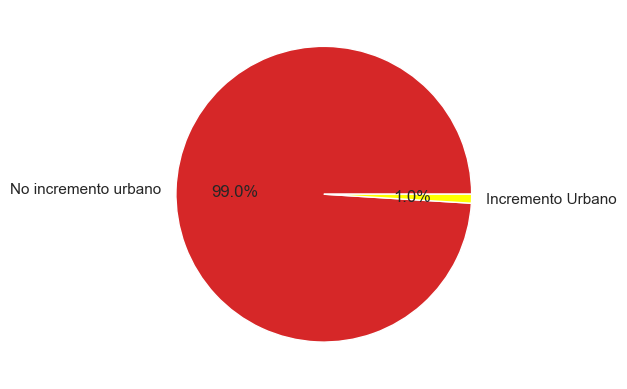

In [479]:
fig, ax = plt.subplots()
labels = ['No incremento urbano', 'Incremento Urbano']
sizes = [len(Y_valid["incremento_urbano"]), np.sum(Y_valid["incremento_urbano"])]
ax.pie(sizes, labels=labels, autopct='%1.1f%%', colors=['tab:red', 'yellow'])
plt.show()


## Planteamiento de una estrategia para resolverlo


**Todos los modelos son errados, pero unos son mas útiles que otros** - *George Edward Pelham Bo*

La búsqueda de un modelo que nos de información útil sobre el futuro no es una tarea sencilla.

Una estrategia para seleccionar un modelo es tener un modelo base. Este modelo debe ser intuitivo, sencillo de entender y debe servir como primera hipótesis.

En este caso proponemos un modelo lineal base $f_{\text{urbano}}$  y compararlo con un modelo de perceptreon multicapa $f_{MLP}$

Cargamos las librerías necesarias


In [480]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
import sklearn.metrics as metrics


Cargamos el conjunto de entrenamiento y validación

In [458]:
xtrain = X_train[X_train.columns[3:3+8]].to_numpy()
ytrain = X_train[X_train.columns[3+8]].to_numpy()

xvalid = X_valid[X_valid.columns[3:3+8]].to_numpy()
yvalid = X_valid[X_valid.columns[3+8]].to_numpy()

In [536]:
import importlib
root = os.getcwd() + "/.."
sys.path.insert(0, root)

import models.modelos_cambio_suelo as modelos
importlib.reload(modelos)

import src.report_functions as report
importlib.reload(report)

import src.toc as toc
importlib.reload(toc)



<module 'src.toc' from '/Users/rodrigo/SourcesCodes/GitHub/Land Cover Simulation Morelia Case/land_cover_simulation/urban_land_simulation_morelia_case/notebooks/../src/toc.py'>

In [345]:
def MLP_model(xtrain, ytrain, xvalid, yvalid):
    import tensorflow as tf
    X_train_resampled, y_train_resampled = undersampler.fit_resample(xtrain, ytrain)
    inputs = tf.keras.Input(shape=(np.shape(X_train_resampled)[1],), name='input')

    x = tf.keras.layers.Dense(150, activation='sigmoid')(inputs)
    x = tf.keras.layers.Dropout(0.5)(x)
    x = tf.keras.layers.Dense(100, activation='sigmoid')(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    x = tf.keras.layers.Dense(50, activation='sigmoid')(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    outputs = tf.keras.layers.Dense(1, activation='sigmoid')(x)

    callback = tf.keras.callbacks.EarlyStopping(monitor = 'loss', patience = 1)

    MLP = tf.keras.Model(inputs=inputs, outputs=outputs)

    MLP.compile(optimizer = 'adam',
                loss = 'binary_crossentropy',
                #loss = CustomAccuracy(),
                #metrics = 'binary_crossentropy'
                metrics = 'binary_crossentropy'
                )

    history_mlp = MLP.fit(X_train_resampled, y_train_resampled, validation_data=(xvalid, yvalid),  callbacks=[callback] , epochs = 40, batch_size = int(len(y_train_resampled)*0.8))
    return history_mlp, MLP
    

In [346]:
def perceptron_model(xtrain, ytrain, xvalid, yvalid):
    import tensorflow as tf

    X_train_resampled, y_train_resampled = undersampler.fit_resample(xtrain, ytrain)
    inputs = tf.keras.Input(shape=(np.shape(X_train_resampled)[1],), name='input')


    outputs = tf.keras.layers.Dense(1, activation='sigmoid')(inputs)

    callback = tf.keras.callbacks.EarlyStopping(monitor = 'loss', patience = 20)

    perceptron = tf.keras.Model(inputs=inputs, outputs=outputs)

    perceptron.compile(optimizer = 'adam',
                loss = 'binary_crossentropy',
                #loss = CustomAccuracy(),
                #metrics = 'binary_crossentropy'
                metrics = 'binary_crossentropy'
                )

    history_perceptron = perceptron.fit(X_train_resampled, y_train_resampled,  callbacks=[callback] , epochs = 10000, batch_size = int(len(y_train_resampled)*1))
    return history_perceptron, perceptron

## Entrenamiento de los modelos

### **Entrenamos el Modelo de regresión Logística**

In [500]:
modelos_nombre = ["Regresión Logística", "Perceptrón Multicapa"]

In [492]:
h_model_A, model_A = modelos.perceptron_model(xtrain, ytrain, xvalid, yvalid)

Epoch 1/10000
1/1 [==============================] - 0s 227ms/step - loss: 1104.5084 - binary_crossentropy: 1104.5084
Epoch 2/10000
1/1 [==============================] - 0s 6ms/step - loss: 1089.6376 - binary_crossentropy: 1089.6376
Epoch 3/10000
1/1 [==============================] - 0s 6ms/step - loss: 1074.8834 - binary_crossentropy: 1074.8834
Epoch 4/10000
1/1 [==============================] - 0s 7ms/step - loss: 1060.2551 - binary_crossentropy: 1060.2551
Epoch 5/10000
1/1 [==============================] - 0s 5ms/step - loss: 1045.7665 - binary_crossentropy: 1045.7665
Epoch 6/10000
1/1 [==============================] - 0s 8ms/step - loss: 1031.4167 - binary_crossentropy: 1031.4167
Epoch 7/10000
1/1 [==============================] - 0s 6ms/step - loss: 1017.2104 - binary_crossentropy: 1017.2104
Epoch 8/10000
1/1 [==============================] - 0s 8ms/step - loss: 1003.1573 - binary_crossentropy: 1003.1573
Epoch 9/10000
1/1 [==============================] - 0s 5ms/step - los

### **Entrenamos el Modelo de Clasificación de Perceptrón Multi-Capa**

In [494]:


h_model_B, model_B = modelos.MLP_model(xtrain, ytrain, xvalid, yvalid)


Epoch 1/40
2/2 [==============================] - 1s 380ms/step - loss: 0.9064 - binary_crossentropy: 0.9064 - val_loss: 1.2645 - val_binary_crossentropy: 1.2645
Epoch 2/40
2/2 [==============================] - 0s 284ms/step - loss: 0.8346 - binary_crossentropy: 0.8346 - val_loss: 1.0480 - val_binary_crossentropy: 1.0480
Epoch 3/40
2/2 [==============================] - 0s 271ms/step - loss: 0.7816 - binary_crossentropy: 0.7816 - val_loss: 0.8665 - val_binary_crossentropy: 0.8665
Epoch 4/40
2/2 [==============================] - 0s 278ms/step - loss: 0.7501 - binary_crossentropy: 0.7501 - val_loss: 0.7227 - val_binary_crossentropy: 0.7227
Epoch 5/40
2/2 [==============================] - 0s 270ms/step - loss: 0.7303 - binary_crossentropy: 0.7303 - val_loss: 0.6179 - val_binary_crossentropy: 0.6179
Epoch 6/40
2/2 [==============================] - 0s 273ms/step - loss: 0.7276 - binary_crossentropy: 0.7276 - val_loss: 0.5492 - val_binary_crossentropy: 0.5492
Epoch 7/40
2/2 [============

In [349]:
def model_report_comparison(xtrain, ytrain, xvalid, yvalid, Models):


    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    for i, M in enumerate(Models):
        print("i:", i)
        axs[i].plot(M.history["loss"], label = "Entrenamiento")
        axs[i].plot(M.history["val_loss"], label = "Validación")
        axs[i].set_title('Convergencia Modelo A')
        axs[i].set_xlabel('Época')
        axs[i].set_ylabel('Entropía Cruzada')
        axs[i].legend()


    # Adjust layout to prevent overlap
    plt.tight_layout()

    # Display the plot
    plt.show()

In [350]:
def cm_comparison(xtrain, ytrain, xvalid, yvalid, Models):


    fig, axs = plt.subplots(2, 2, figsize=(10, 10))

    for i, M in enumerate(Models):
        
        y_train_hat = M.predict(xtrain)
        y_valid_hat = M.predict(xvalid)

        q = np.sum(yvalid)
        tr = np.sort(y_valid_hat.flatten())[::-1][q]

        axs[1,i].plot(np.sort(y_valid_hat.flatten())[::-1][:q*10], label = "Sorted ranks")
        axs[1,i].vlines(x = q, ymin = 0, ymax = 1, color = "red",linestyles='dotted', label = "Threshold {t} producing {q} urban cells".format(t=np.round(tr,4), q=q))



    # Adjust layout to prevent overlap
    plt.tight_layout()

    # Display the plot
    
    plt.show()

    

In [351]:
def simulate(xtrain, ytrain, xvalid, yvalid, Models):
    dict ={}
    for i, M in enumerate(Models):
        dict["m_{i}_haty_train".format(i=i)] = M.predict(xtrain)
        dict["m_{i}_haty_valid".format(i=i)] = M.predict(xvalid)
    
    return dict





In [496]:

D = report.simulate(xtrain, ytrain, xvalid, yvalid, [model_A, model_B])
fprlogvalid, tprlogvalid, _ = metrics.roc_curve(yvalid,  D['m_{i}_haty_valid'.format(i=1)].flatten())

31313/31313 [==============================] - 10s 322us/step


Mostramos el desempeño de modelo segun la curva ROC


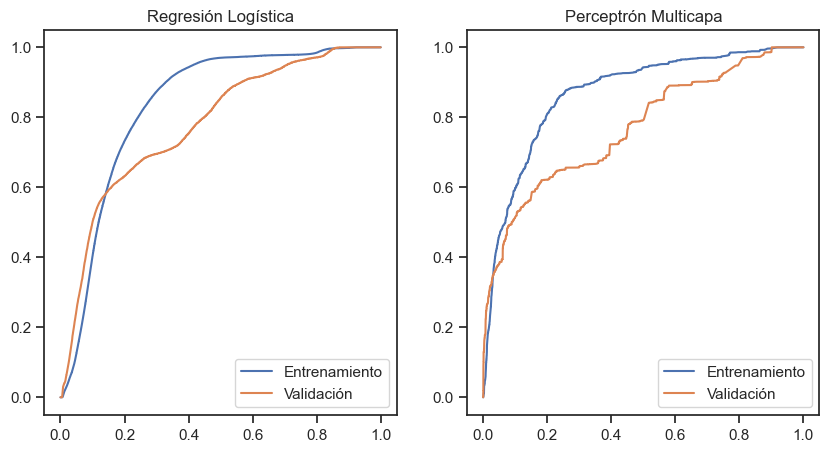

In [505]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

q = np.sum(yvalid)
for i in range(2):

    tr = D['m_{i}_haty_valid'.format(i=i)].flatten()[::-1][q]   
    fprlogtrain, tprlogtrain, _ = metrics.roc_curve(ytrain,  D['m_{i}_haty_train'.format(i=i)].flatten())
    fprlogvalid, tprlogvalid, _ = metrics.roc_curve(yvalid,  D['m_{i}_haty_valid'.format(i=i)].flatten())
    axs[i].plot(fprlogtrain, tprlogtrain, label = "Entrenamiento")
    axs[i].plot(fprlogvalid, tprlogvalid, label = "Validación")
    axs[i].legend()
    axs[i].set_title(modelos_nombre[i])

## La comparación de dos curvas TOC.
Enseguida se muestra el desempeño del modelo con una de las herramientas desarrolladas en CentroGeo. 


<Figure size 640x480 with 0 Axes>

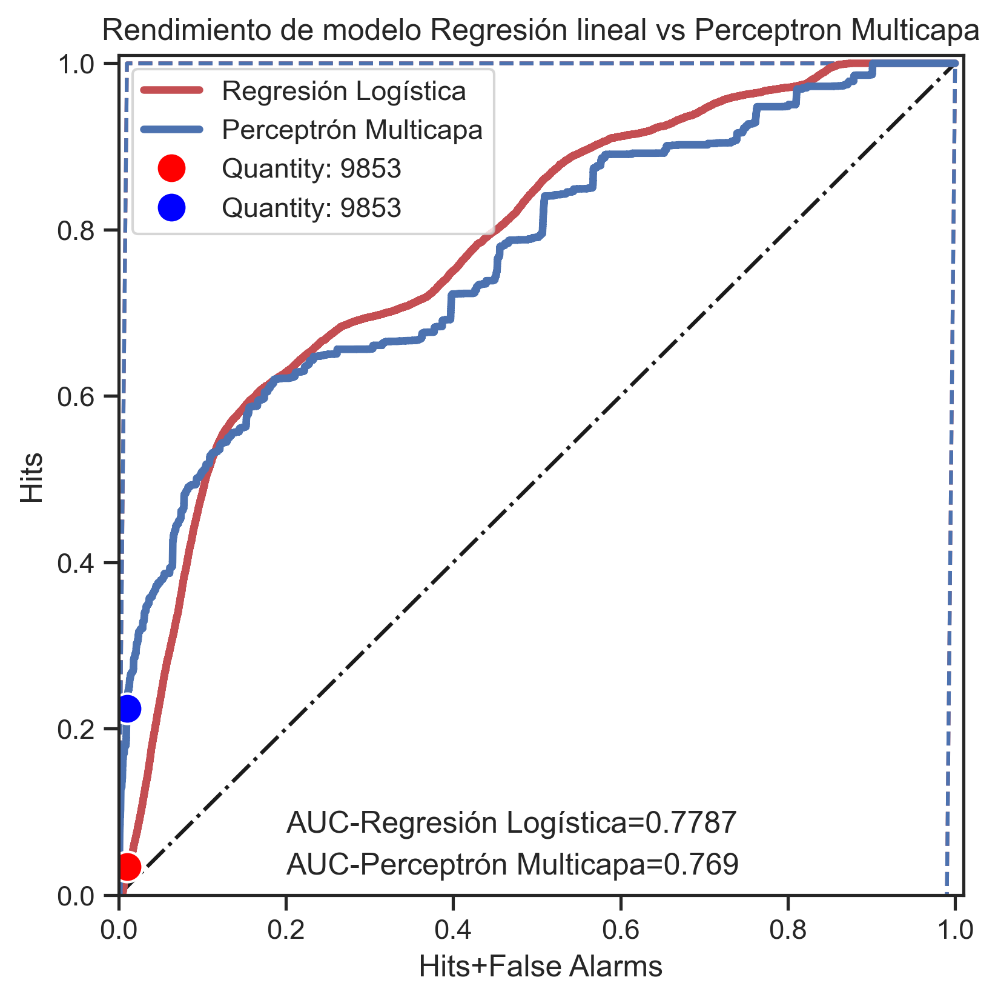

In [551]:
TOC = list()
for i in range(2):


    rank = D['m_{i}_haty_valid'.format(i=i)].flatten()
    groundTruth = yvalid
    T = toc.compute(rank, groundTruth)
    TOC.append(T)

#i = 1
#rank = D['m_{i}_haty_valid'.format(i=i)].flatten()
#groundTruth = yvalid
#T2 = toc.compute(rank, groundTruth)

toc.plotComp(TOC[0],TOC[1],TOCname1= modelos_nombre[0],TOCname2 = modelos_nombre[1],title='Rendimiento de modelo Regresión lineal vs Perceptron Multicapa', ne = [np.sum(yvalid), np.sum(yvalid)])

Los modelos en general se comportan muy similar segun su Area Bajo la curva AUC pero, al analizar  el desempeño del modelo en operando para localizar $9853$ celdas urbanas con las curvas TOC, el modelo de Perceptrón multicapa es mejor. Produce mas Aciertos el perceptrón multicapa que la regresión Logística para una cantidad de celdas urbanas esperadas.

Comparamos el desempeño según su matriz de confusión

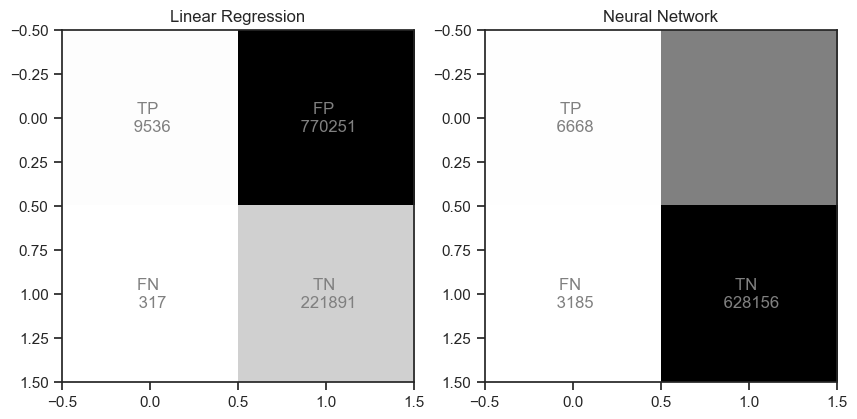

In [548]:
import matplotlib as mpl
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
modelName = ["Linear Regression", "Neural Network"]
label = np.array(["TP", "FP", "FN", "TN"])
Y = yvalid
for i in range(2):    
    axs[i].axis('on')
    tr = D['m_{i}_haty_valid'.format(i=i)].flatten()[::-1][q]   
    y = D['m_{i}_haty_valid'.format(i=i)].flatten()>tr
    tn, fp, fn, tp  = metrics.confusion_matrix(Y, y).ravel()  
    M = np.array([[tp, fp],[fn,tn]])
    c = 0
    for ii in range(M.shape[0]):
        for jj in range(M.shape[1]):
            st = "{l} \n {n}".format(l = label[c], n = M[ii, jj])
            axs[i].set_title(modelName[i])
            axs[i].text(x=jj, y=ii, s=st, va='center', ha='center', color='gray')
            c= c+1

    axs[i].imshow(M/np.sum(M), cmap = mpl.colormaps['Greys'])

Asignamos los resultados a la base de datos de cada modelo

In [552]:
X_valid["probability_linear_classification"] = D["m_0_haty_valid"].flatten()
X_valid["probability_MLP_classification"] = D["m_1_haty_valid"].flatten()
X_valid["linear_classification"] = 1*(y_valid_hat.flatten()>tr)
q = np.sum(yvalid)
Y = yvalid
for i in range(2):

    tr = D['m_{i}_haty_valid'.format(i=i)].flatten()[::-1][q]   
    y = D['m_{i}_haty_valid'.format(i=i)].flatten()>tr
    X_valid["M{i}".format(i=i)] = y*1

q = np.sum(yvalid)

i = 0
tr = np.sort(D['m_{i}_haty_valid'.format(i=i)].flatten())[::-1][q]
y = D['m_{i}_haty_valid'.format(i=i)].flatten()>tr
X_valid["M0"] = y*1

i = 1
tr = np.sort(D['m_{i}_haty_valid'.format(i=i)].flatten())[::-1][q]
y = D['m_{i}_haty_valid'.format(i=i)].flatten()>tr
X_valid["M1"] = y*1


In [557]:
for i in range(2):

    X_valid.loc[(X_valid["incremento_urbano"]==1) & (X_valid["M{i}".format(i=i)]==1),"color_M0"] = "TP"
    X_valid.loc[(X_valid["incremento_urbano"]==0) & (X_valid["M{i}".format(i=i)]==0),"color_M0"] = "TN"
    X_valid.loc[(X_valid["incremento_urbano"]==1) & (X_valid["M{i}".format(i=i)]==0),"color_M0"] = "FN"
    X_valid.loc[(X_valid["incremento_urbano"]==0) & (X_valid["M{i}".format(i=i)]==1),"color_M0"] = "FP"

In [512]:
#X_valid.loc[(X_valid["incremento_urbano"]==1) & (X_valid["M1"]==1),"color_M1"] = "TP"
#X_valid.loc[(X_valid["incremento_urbano"]==0) & (X_valid["M1"]==0),"color_M1"] = "TN"
#X_valid.loc[(X_valid["incremento_urbano"]==1) & (X_valid["M1"]==0),"color_M1"] = "FN"
#X_valid.loc[(X_valid["incremento_urbano"]==0) & (X_valid["M1"]==1),"color_M1"] = "FP"

In [558]:
pointsPalette = {'TP': 'red',
                 'TN': 'gray', 
                 'FP': 'yellow', 
                 'FN': 'blue' 
                }

In [559]:
from matplotlib.colors import ListedColormap


# [R,G,B,Alpha]
amarillo = np.array([1, 1, 0, 1])
azul = np.array([0, 0, 1, 1])
gris = np.array([0.5, 0.5, 0.5, 1])
rojo = np.array([1, 0, 0, 1])


paletaConfusion = np.zeros((4,4))
paletaConfusion[:1, :] = amarillo
paletaConfusion[1:2, :] = azul
paletaConfusion[3:4, :] = rojo
paletaConfusion[2:3, :] = gris

mapaDeColores = ListedColormap(paletaConfusion)


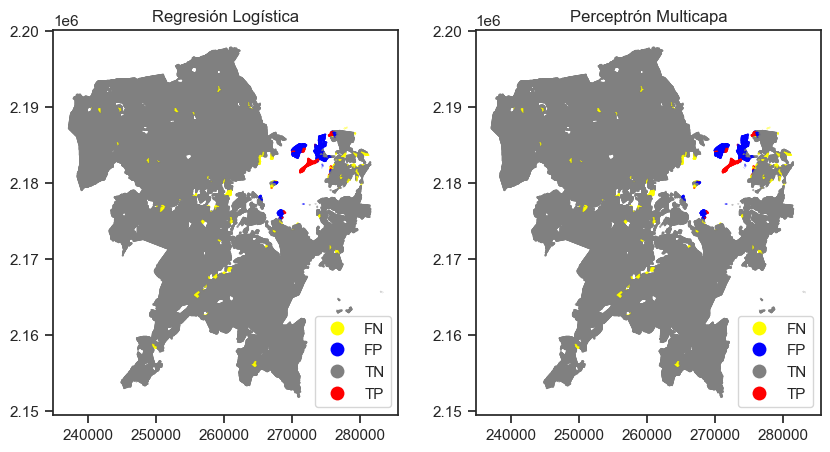

In [563]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))


#este tiene que ser geodata
data = X_valid
geometry = [Point(xy) for xy in zip(data["lat"], data["lon"])]
geodata = gpd.GeoDataFrame(data, crs = crs_m, geometry = geometry)

for i in range(2):

    axs[i].set_title(modelos_nombre[i])
    geodata.plot(ax=axs[i], column = X_valid["color_M{i}".format(i=i)], cmap = mapaDeColores, legend = True, markersize = 0.01)



In [124]:
import branca.colormap as cm
import folium
from folium import plugins
from pyproj import Transformer
from pyproj import Proj


step = cm.StepColormap(
    ["green", "yellow", "red"], vmin=3, vmax=10, index=[3, 4, 8, 10], caption="step"
)

colormap=cm.linear.viridis.to_step(5).scale(0, 1)
ix = np.arange(len(X_valid))
np.random.shuffle(ix)
limit = 10000


In [126]:


tile_url = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}'


myProj = Proj("+proj=utm +zone=14 +north +ellps=WGS84 +datum=WGS84 +units=m +no_defs")
lon1, lat1 = myProj(X_valid["lat"].to_numpy()[ix][:limit], X_valid["lon"].to_numpy()[ix][:limit], inverse=True)

m1=folium.Map(location=[19.70078, -101.18443], tiles=tile_url, zoom_start=10, attr='Esri',overlay=False, control=True)
for lat,lon,val in zip(lat1, lon1, X_valid["probability_linear_classification"].to_numpy()[ix][:limit]):
     folium.CircleMarker([lat, lon],
                            radius=2,
                            color=False,
                            fill_color=colormap(val),
                            fill=True,
                            fill_opacity=0.5
                           ).add_to(m1)

In [127]:
m1

In [443]:
m1=folium.Map(location=[19.70078, -101.18443], tiles=tile_url, zoom_start=10, attr='Esri',overlay=False, control=True)
for lat,lon,val in zip(lat1, lon1, X_valid["probability_MLP_classification"].to_numpy()[ix][:limit]):
     folium.CircleMarker([lat, lon],
                            radius=2,
                            color=False,
                            fill_color=colormap(val),
                            fill=True,
                            fill_opacity=0.5
                           ).add_to(m1)
m1
